### Import Numpy and Pandas Libraries

In [32]:
import numpy as np
import pandas as pd 

In [34]:
print('Numpy version:', np.__version__)
print('pandas version:',pd.__version__)

Numpy version: 1.26.4
pandas version: 2.2.2


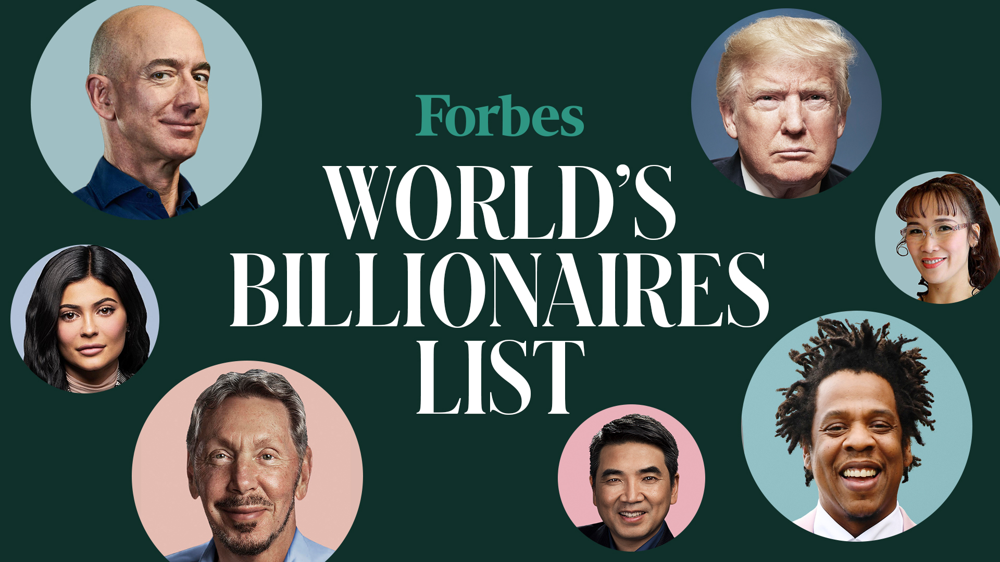

# Q1. Read the '.csv' file into a data frame and display the first 5 rows.

In [36]:
df = pd.read_csv("C:\\Users\\sashw\\Downloads\\Forbes_Billionaire.csv")
df.head()

,Rank,Name,Age,Net Worth,Country,Source,Industries
0,1,JEFF BEZOS,56.0,113.0,United States,Amazon,Technology
1,2,BILL GATES,64.0,98.0,United States,Microsoft,Technology
2,3,BERNARD ARNAULT & FAMILY,71.0,76.0,France,LVMH,Fashion & Retail
3,4,WARREN BUFFETT,89.0,67.5,United States,Berkshire Hathaway,Finance & Investments
4,5,LARRY ELLISON,75.0,59.0,United States,software,Technology


# Q2. Name the top 8 industries with maximum count of billionaires

In [39]:
pd.DataFrame(df.groupby('Industries')['Name'].nunique()).sort_values(by='Name',ascending=False).head(8)

,Name
Industries,
Finance & Investments,298
Technology,241
Fashion & Retail,209
Manufacturing,198
Real Estate,196
Diversified,169
Food & Beverage,168
Healthcare,149


In [41]:
df_top8 = pd.DataFrame(df.groupby('Industries')['Name'].nunique()).reset_index().sort_values(by='Name',ascending=False).head(8)
df_top8

,Industries,Name
5,Finance & Investments,298
16,Technology,241
4,Fashion & Retail,209
10,Manufacturing,198
13,Real Estate,196
2,Diversified,169
6,Food & Beverage,168
8,Healthcare,149


In [43]:
df_top8.iloc[0:8,0:1]

,Industries
5,Finance & Investments
16,Technology
4,Fashion & Retail
10,Manufacturing
13,Real Estate
2,Diversified
6,Food & Beverage
8,Healthcare


# Q3. State the headcount of billionaires from these top 8 industries

In [46]:
df_top8

,Industries,Name
5,Finance & Investments,298
16,Technology,241
4,Fashion & Retail,209
10,Manufacturing,198
13,Real Estate,196
2,Diversified,169
6,Food & Beverage,168
8,Healthcare,149


# Q4. Compare the mean of net worth of billionaires from these top 8 industries.

In [49]:
new_df_top8 = pd.DataFrame(columns=df.columns)
new_df_top8

,Rank,Name,Age,Net Worth,Country,Source,Industries


In [83]:
## Running a loop to get 8 industries with the most number of billionaries
new_df_top8 = pd.DataFrame()  # Initialize empty DataFrame
for i in df_top8['Industries']:
    a = df[df['Industries']==i] # subsetting the original data frame with these industries
    # Using concat instead of append
    new_df_top8 = pd.concat([new_df_top8, a], ignore_index=True)

new_df_top8

,Rank,Name,Age,Net Worth,Country,Source,Industries
0,4,WARREN BUFFETT,89.0,67.5,United States,Berkshire Hathaway,Finance & Investments
1,36,JIM SIMONS,81.0,21.6,United States,hedge funds,Finance & Investments
2,39,JOSEPH SAFRA,81.0,19.9,Brazil,banking,Finance & Investments
3,46,RAY DALIO,70.0,18.0,United States,hedge funds,Finance & Investments
4,64,STEPHEN SCHWARZMAN,73.0,15.4,United States,investments,Finance & Investments
...,...,...,...,...,...,...,...
1623,1990,HENRI BEAUFOUR,54.0,1.0,France,pharmaceuticals,Healthcare
1624,1990,ANNE BEAUFOUR,56.0,1.0,France,pharmaceuticals,Healthcare
1625,1990,VADIM YAKUNIN,57.0,1.0,Russia,pharmacy,Healthcare
1626,1990,FAN MINHUA,58.0,1.0,China,pharmaceuticals,Healthcare


# Q5. Compare the mean age of billionaires from these top 8 industries.

In [95]:
for i in new_df_top8['Industries'].unique():
    print('the average age of the billioners of the industry is:',new_df_top8[new_df_top8['Industries']==i]['Age'].mean(),'years.')

the average age of the billioners of the industry is: 65.8108108108108 years.
the average age of the billioners of the industry is: 55.37552742616034 years.
the average age of the billioners of the industry is: 66.89320388349515 years.
the average age of the billioners of the industry is: 64.139896373057 years.
the average age of the billioners of the industry is: 65.89528795811518 years.
the average age of the billioners of the industry is: 66.88957055214723 years.
the average age of the billioners of the industry is: 64.8625 years.
the average age of the billioners of the industry is: 63.08843537414966 years.


# Q6. Name the Richest billionaire in the Automotive sector

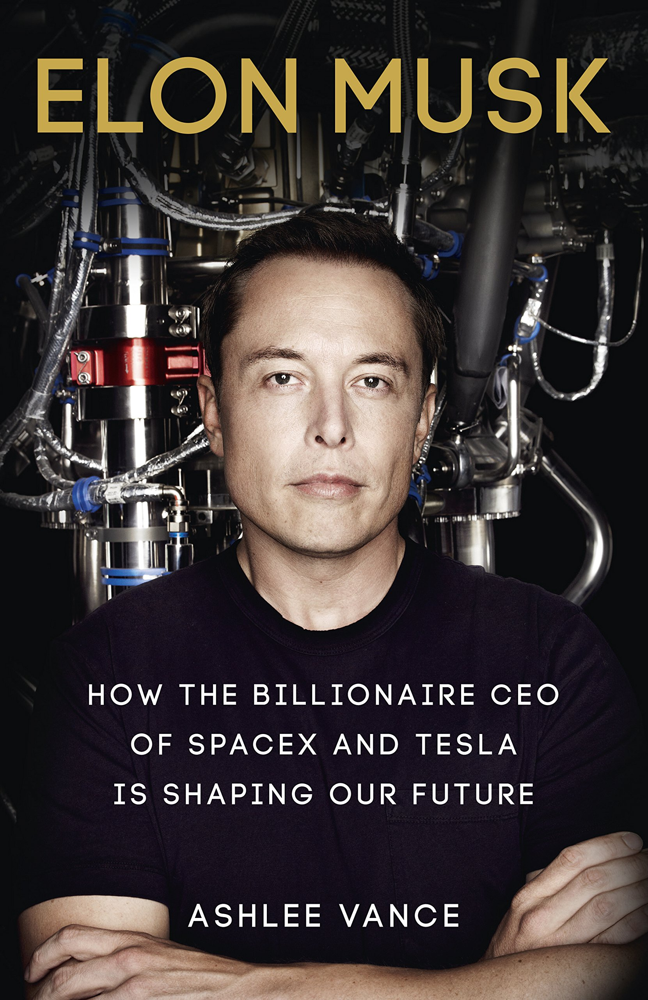

In [102]:
df['Industries'].unique()

array(['Technology', 'Fashion & Retail', 'Finance & Investments',
       'Telecom', 'Media & Entertainment', 'Diversified', 'Energy',
       'Real Estate', 'Gambling & Casinos', 'Food & Beverage',
       'Automotive', 'Manufacturing', 'Metals & Mining', 'Service',
       'Healthcare', 'Logistics', 'Construction & Engineering', 'Sports'],
      dtype=object)

In [104]:
df[df['Industries']=='Automotive'].sort_values(by='Net Worth',ascending=False).head(1)

,Rank,Name,Age,Net Worth,Country,Source,Industries
30,31,ELON MUSK,48.0,24.6,United States,"Tesla, SpaceX",Automotive


# Q7. Name top 5 countries with maximum number of billionaires.

In [108]:
df_top5 = pd.DataFrame(df.groupby('Country')['Name'].nunique()).reset_index().sort_values(by='Name',ascending=False).head(5)
df_top5

,Country,Name
68,United States,614
9,China,387
19,Germany,107
25,India,102
52,Russia,99


In [110]:
df_top5.iloc[0:5,0:1]

,Country
68,United States
9,China
19,Germany
25,India
52,Russia


# Q8. Which amongst these top 5 countries have the lowest mean age of billionaires ?

In [112]:
mean_age_df = pd.DataFrame(columns=['Country','Mean Age'])
mean_age_df

,Country,Mean Age


In [118]:
#for i in df_top5['Country']:
    #mean = df[df['Country']==i]['Age'].mean()
    #print('The mean age of',i,'is',mean,'years.')
    #mean_age_df = mean_age_df.append({'Country':i,'Mean Age':mean},ignore_index=True)'''

for i in df_top5['Country']:
    mean = df[df['Country']==i]['Age'].mean()
    print('The mean age of',i,'is',mean,'years.')
    # Create a temporary DataFrame with the new row
    new_row = pd.DataFrame({'Country':[i], 'Mean Age':[mean]})
    # Use concat instead of append
    mean_age_df = pd.concat([mean_age_df, new_row], ignore_index=True)

The mean age of United States is 66.91162029459902 years.
The mean age of China is 56.79002624671916 years.
The mean age of Germany is 64.14736842105263 years.
The mean age of India is 66.20618556701031 years.
The mean age of Russia is 56.84848484848485 years.


# Q9 Name the richest Chinese billionaire and his net worth

In [130]:
print('The richest Chinese billionaire is',df[df['Country']=='China'].sort_values(by='Net Worth',ascending=False).head(1).values[0][1],'with a Net Worth of',df[df['Country']=='China'].sort_values(by='Net Worth',ascending=False).head(1).values[0][2],'billions.')

The richest Chinese billionaire is JACK MA with a Net Worth of 55.0 billions.


# Q10 Name top 5 Industries with maximum number of Indian billionaires

In [138]:
pd.DataFrame(df[df['Country']=='India'].groupby('Industries')['Name'].nunique()).reset_index().sort_values(by='Name',ascending=False).head(5)

,Industries,Name
7,Healthcare,17
8,Manufacturing,14
2,Diversified,13
13,Technology,11
6,Food & Beverage,8


In [140]:
print('The top 5 industries with maximum number of Indian billionaires are the following:')
pd.DataFrame(df[df['Country']=='India'].groupby('Industries')['Name'].nunique()).reset_index().sort_values(by='Name',ascending=False).head(5).iloc[0:5,0:1]

The top 5 industries with maximum number of Indian billionaires are the following:


,Industries
7,Healthcare
8,Manufacturing
2,Diversified
13,Technology
6,Food & Beverage


# Q11. Name all the Indian billionaires in global top 100 list.

In [142]:
top_100 = df.sort_values(by='Net Worth',ascending=False).head(100)
top_100

,Rank,Name,Age,Net Worth,Country,Source,Industries
0,1,JEFF BEZOS,56.0,113.0,United States,Amazon,Technology
1,2,BILL GATES,64.0,98.0,United States,Microsoft,Technology
2,3,BERNARD ARNAULT & FAMILY,71.0,76.0,France,LVMH,Fashion & Retail
3,4,WARREN BUFFETT,89.0,67.5,United States,Berkshire Hathaway,Finance & Investments
4,5,LARRY ELLISON,75.0,59.0,United States,software,Technology
...,...,...,...,...,...,...,...
95,96,LI SHUFU,56.0,12.4,China,automobiles,Automotive
96,96,HASSO PLATTNER & FAMILY,76.0,12.4,Germany,software,Technology
98,98,STEFAN QUANDT,53.0,12.3,Germany,BMW,Automotive
97,98,LIU YONGHAO & FAMILY,68.0,12.3,China,agribusiness,Service


In [144]:
top_100[top_100['Country']=='India']['Name'].values

array(['MUKESH AMBANI', 'RADHAKISHAN DAMANI & FAMILY'], dtype=object)

# Q12. Name all the billionaires in India who are younger than 50 years. Also state their mean net worth

In [146]:
Indian_billionaires = df[df['Country']=='India']
Indian_billionaires

,Rank,Name,Age,Net Worth,Country,Source,Industries
20,21,MUKESH AMBANI,62.0,36.8,India,"petrochemicals, oil & gas",Energy
77,78,RADHAKISHAN DAMANI & FAMILY,65.0,13.8,India,"retail, investments",Fashion & Retail
102,103,SHIV NADAR,74.0,11.9,India,software services,Technology
128,129,UDAY KOTAK,61.0,10.4,India,banking,Finance & Investments
154,155,GAUTAM ADANI,57.0,8.9,India,"commodities, ports",Diversified
...,...,...,...,...,...,...,...
1888,1851,SANDEEP ENGINEER,58.0,1.1,India,plastic pipes,Manufacturing
1902,1851,S.D. SHIBULAL,65.0,1.1,India,software services,Technology
1970,1851,ARVIND PODDAR,62.0,1.1,India,tires,Automotive
1983,1851,MOFATRAJ MUNOT,75.0,1.1,India,real estate,Real Estate


In [148]:
print('The names of the Indian Billionaires under the age of 50 are:')
Indian_billionaires[Indian_billionaires['Age']<50]['Name'].values

The names of the Indian Billionaires under the age of 50 are:


array(['VIJAY SHEKHAR SHARMA', 'BYJU RAVEENDRAN', 'VIKAS OBEROI',
       'RANJAN PAI', 'SHAMSHEER VAYALIL', 'SACHIN BANSAL', 'RADHA VEMBU',
       'BINNY BANSAL', 'ACHARYA BALKRISHNA'], dtype=object)

In [150]:
print('The average Net Worth of Indian Billionaires below the age of 50 is')
round(Indian_billionaires[Indian_billionaires['Age']<50]['Net Worth'].mean(),3)

The average Net Worth of Indian Billionaires below the age of 50 is


1.489

# Q13. Name the Indian billionaires from real estate sector who are richer than 'DONALD TRUMP'.

In [152]:
df[df['Name']=='DONALD TRUMP']

,Rank,Name,Age,Net Worth,Country,Source,Industries
1047,1001,DONALD TRUMP,73.0,2.1,United States,real estate,Real Estate


In [154]:
Indian_billionaires_realestate = Indian_billionaires[Indian_billionaires['Industries']=='Real Estate']
Indian_billionaires_realestate

,Rank,Name,Age,Net Worth,Country,Source,Industries
494,494,KUSHAL PAL SINGH,88.0,3.7,India,real estate,Real Estate
774,764,CHANDRU RAHEJA,79.0,2.7,India,real estate,Real Estate
1237,1196,VIKAS OBEROI,49.0,1.8,India,real estate,Real Estate
1253,1196,MANGAL PRABHAT LODHA,64.0,1.8,India,real estate,Real Estate
1395,1335,JITENDRA VIRWANI,54.0,1.6,India,real estate,Real Estate
1712,1613,NIRANJAN HIRANANDANI,70.0,1.3,India,real estate,Real Estate
1716,1613,SUBHASH RUNWAL,76.0,1.3,India,real estate,Real Estate
1983,1851,MOFATRAJ MUNOT,75.0,1.1,India,real estate,Real Estate


In [156]:
Indian_billionaires_realestate[Indian_billionaires_realestate['Net Worth']>df[df['Name']=='DONALD TRUMP'].values[0][3]]


,Rank,Name,Age,Net Worth,Country,Source,Industries
494,494,KUSHAL PAL SINGH,88.0,3.7,India,real estate,Real Estate
774,764,CHANDRU RAHEJA,79.0,2.7,India,real estate,Real Estate


In [158]:
print('The Indian billionaires from the Real Estate Industry who are richer than Donald Trump are',Indian_billionaires_realestate[Indian_billionaires_realestate['Net Worth']>df[df['Name']=='DONALD TRUMP'].values[0][3]].iloc[0:2,1:2].values[0][0],'and',Indian_billionaires_realestate[Indian_billionaires_realestate['Net Worth']>df[df['Name']=='DONALD TRUMP'].values[0][3]].iloc[0:2,1:2].values[1][0])

The Indian billionaires from the Real Estate Industry who are richer than Donald Trump are KUSHAL PAL SINGH and CHANDRU RAHEJA


# Q14. What is the total cumulative net worth of all the billionaires?

In [160]:
df['Net Worth'].sum()

8037.499999999999

# END